# Fraud Detection and Analysis for Insurance Claim using Machine Learning

### Problem Statement:

## Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

In [1]:
# Importing Required Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Insurance_Claim.csv')
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,10/17/2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,6/27/2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,09-06-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,5/25/1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


Copied the raw data and saved it as a csv file on my local computer after which I imported the entire dataset on this Jupyter Notebook with the help of pandas.

The dataset contains both categorical and numerical columns. Here "fraud_reported" is our target column, since it has two categories so it is termed to be "Classification Problem" where we need to predict if an insurance claim is fraudulent or not.

## Exploratory Data Analysis (EDA)

In [3]:
# Checking dimension of dataset
df.shape

(1000, 39)

The dataset contains 1000 rows and 39 columns. Out of 40 columns 39 are independent columns and remaining one is our target variable "fraud_reported".

In [4]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,10/17/2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,6/27/2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,09-06-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,5/25/1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [5]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
995,3,38,941851,7/16/1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,01-05-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,2/17/2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,11/18/2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,3,?,5060,460,920,3680,Mercedes,E400,2007,N


In [6]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

### Feature columns:

Company's data for insurance claim policy : months_as_customer, age, policy_number(dropped), policy_bind_date, policy_csl, policy_deductable, policy_annual_premium, umbrella_limit

Personal details of the customers : insured_zip, insured_sex, insured_education_level, insured_occupation, insured_hobbies, insured_relationship, capital- gains, capital-loss.

Details of the incident: incident_date, incident_type, collision_type, incident_severity, authorities_contacted, incident_state, incident_city, incident_location(dropped), incident_hour_of_the_day, number_of_vehicles_involved, property_damage, bodily_injuries, witnesses, police_report_available, total_amount_claimed, injury_claim, property_claim, vehicle_claim, auto_make, auto_model, auto_year

Target label:

fraud_reported : Y-YES / N-NO

In [7]:
# To get good overview of the dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [8]:
# Checking null values
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

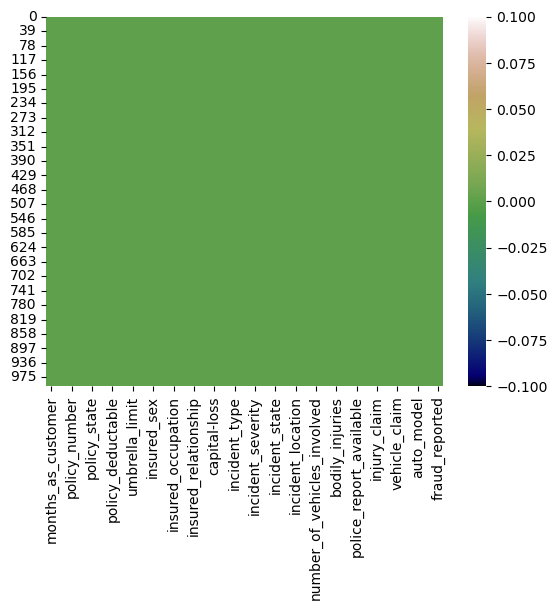

In [9]:
# Let's visualize the null values clearly
sns.heatmap(df.isnull(), cmap="gist_earth")
plt.show()

In [10]:
# Checking the type of dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [11]:
# Checking number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


# Data Preprocessing

## Feature selection

In [12]:
# Dropping policy_number and incident_location columns
df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

In [13]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('*'*60)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
************************************************************
01-01-2006    3
4/28/1992     3
08-05-1992    3
12/14/1991    2
08-09-2004    2
             ..
06-03-2014    1
12-12-1998    1
2/18/1999     1
10/30/1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
************************************************************
OH

These are the list of value counts in each columns.

By looking at the value counts of each column we can realize that the columns umbrella_limit, capital-gains and capital-loss contains more zero values around 79.8%, 50.8% and 47.5%. I am keeping the zero values in capital_gains and capital_loss columns as it is. Since the umbrella_limit columns has more that 70% of zero values, let's drop that column.

Also the collision_type, police_report_available and property_damage have ? in them

In [14]:
# Dropping umbrella_limit column
df.drop("umbrella_limit",axis=1,inplace=True)

# Feature Extraction

The policy_bind_date and incident_date have object data type which should be in datetime data type that means the python is not able to understand the type of these column and giving default data type. We will convert this object data type to datetime data type and we will extract the vaues from these columns.

In [15]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [16]:
# Again checking the type of dataset
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_zip                             int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                     

Now we have converted object data type into datetime data type. Now let's extract Day, Month and Year from both the columns

In [17]:
# Extracting Day, Month and Year column from policy_bind_date
df["policy_bind_Day"] = df['policy_bind_date'].dt.day
df["policy_bind_Month"] = df['policy_bind_date'].dt.month
df["policy_bind_Year"] = df['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
df["incident_Day"] = df['incident_date'].dt.day
df["incident_Month"] = df['incident_date'].dt.month
df["incident_Year"] = df['incident_date'].dt.year

Now we have extracted Day, Month and Year columns from both policy_bind_date and incident_date columns. So we can drop these columns.

In [18]:
# Dropping policy_bind_date and incident_date columns
df.drop(["policy_bind_date","incident_date"],axis=1,inplace=True)

We have dropped the columns policy_bind_date and incident_date as we have extracted the required data from those columns.

From the value counts of the columns we can also observe the some columns have "?" values, they are not NAN values but we need to fill them.

In [19]:
# Checking which columns contains "?" sign
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

These are the columns which contains "?" sign. Since these column seems to be categorical so we will replace "?" values with most frequently occuring values of the respective columns that is their mode values.

In [20]:
# Checking mode of the above columns
print("The mode of collision_type is:",df["collision_type"].mode())
print("The mode of property_damage is:",df["property_damage"].mode())
print("The mode of police_report_available is:",df["police_report_available"].mode())

The mode of collision_type is: 0    Rear Collision
Name: collision_type, dtype: object
The mode of property_damage is: 0    ?
Name: property_damage, dtype: object
The mode of police_report_available is: 0     ?
1    NO
Name: police_report_available, dtype: object


The mode of property_damage and police_report_available is "?", which means the data is almost covered by "?" sign. So we will fill them by the second highest count of the respective column.

In [21]:
# Checking value count of property_damage column and police_report_available
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of property_damage:
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 ?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


Here "NO" is the second highest occured category in both property_damage and police_report_available column. We will replace "?" by "NO".

In [22]:
# Replacing "?" by their mode values
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [23]:
# Checking value count again
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


Here we have replaced the "?" sign by mode and "NO" values.

The policy_csl column showing object data type but it contains numerical data, may be it is because of the presence of "/" in that column. So first we will extract two columns csl_per_person and csl_per_accident from policy_csl colums and then will convert their object data type into integer data type.

In [24]:
# Extracting csl_per_person and csl_per_accident from policy_csl column
df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

In [25]:
# Converting object data type into integer data type
df['csl_per_person'] = df['csl_per_person'].astype('int64')
df['csl_per_accident'] = df['csl_per_accident'].astype('int64')

In [26]:
# Since we have extracted the data from policy_csl, let's drop that column
df.drop("policy_csl",axis=1,inplace=True)

In [27]:
# Let's extract age of the vehicle from auto_year by subtracting it from the year 2018
df["Vehicle_Age"] = 2018 - df["auto_year"]
df.drop("auto_year",axis=1, inplace = True)

Here we have extracted age of the vehicle on the basis of auto year by assuming the data is collected in the year 2018.

In [28]:
# Let's check the unique values again
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_zip,995
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20


These are the unique values present in each column after feature extraction and selection. Here incident_Year column has one unique value through out the column also it is not important for our prediction so we can drop this column.

In [29]:
# Dropping incident_Year column 
df.drop("incident_Year", axis=1, inplace=True)

In [30]:
# Let's take a look at the dataframe after preprocessing
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,...,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,...,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,430632,FEMALE,PhD,sales,board-games,...,RAM,N,6,9,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,...,Tahoe,Y,25,5,1990,10,1,250,500,4
4,228,44,IL,1000,1583.91,610706,MALE,Associate,sales,board-games,...,RSX,N,6,6,2014,17,2,500,1000,9


In [31]:
df.shape

(1000, 40)

In [32]:
# Separating numerical and categorcal columns

# Checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)

Categorical columns are:
 ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [33]:
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']


In [34]:
# Checking the list of counts of target
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

There are two unique categories in fraud_reported column these values tells about if an insurance claim is fraudulent or not. Here we can assume that "Y" stands for "Yes" that is the insurance is fraudulent and "N" stands for "No" means the insurance claim is not fraudulent.

In [35]:
# Checking the unique values in target column
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

From the value count of the target column fraud_reported we can notice the count of the categories are different which means the data is not balanced. We will use oversampling method to balance the data before building the models.

# Statistical Summary of Dataset

In [36]:
# Statistical summary of numerical columns
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,NaN,NaN,NaN,203.954,115.113174,0.0,115.75,199.5,276.25,479.0
age,1000.0,NaN,NaN,NaN,38.948,9.140287,19.0,32.0,38.0,44.0,64.0
policy_state,1000,3,OH,352,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy_deductable,1000.0,NaN,NaN,NaN,1136.0,611.864673,500.0,500.0,1000.0,2000.0,2000.0
policy_annual_premium,1000.0,NaN,NaN,NaN,1256.40615,244.167395,433.33,1089.6075,1257.2,1415.695,2047.59
insured_zip,1000.0,NaN,NaN,NaN,501214.488,71701.610941,430104.0,448404.5,466445.5,603251.0,620962.0
insured_sex,1000,2,FEMALE,537,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_education_level,1000,7,JD,161,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_occupation,1000,14,machine-op-inspct,93,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_hobbies,1000,20,reading,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Visualization

N    753
Y    247
Name: fraud_reported, dtype: int64


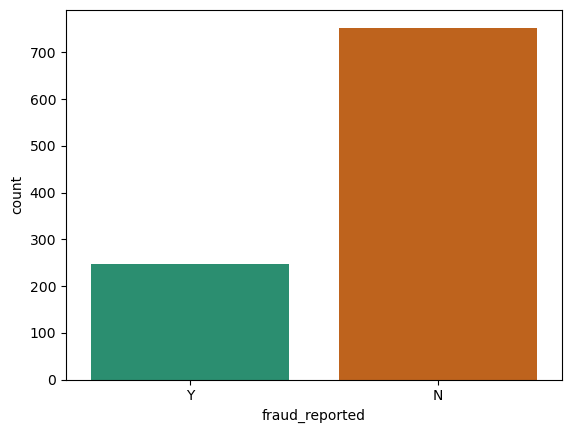

In [37]:
#Visualizing how many insurance claims is fraudulent
print(df["fraud_reported"].value_counts())
sns.countplot(df["fraud_reported"],palette="Dark2")
plt.show()

From the plot we can observe that the count of "N" is high compared to "N". We can assume that "Y" stands for "Yes" that is the insurance is fraudulent and "N" stands for "No" means the insurance claim is not fraudulent. Here most of the insurance claims have not reported as fradulent.

Since it is our target column, it indicates the class imbalance issue. We will balance the data using oversampling method in later part.

Pie plot for the column: policy_state


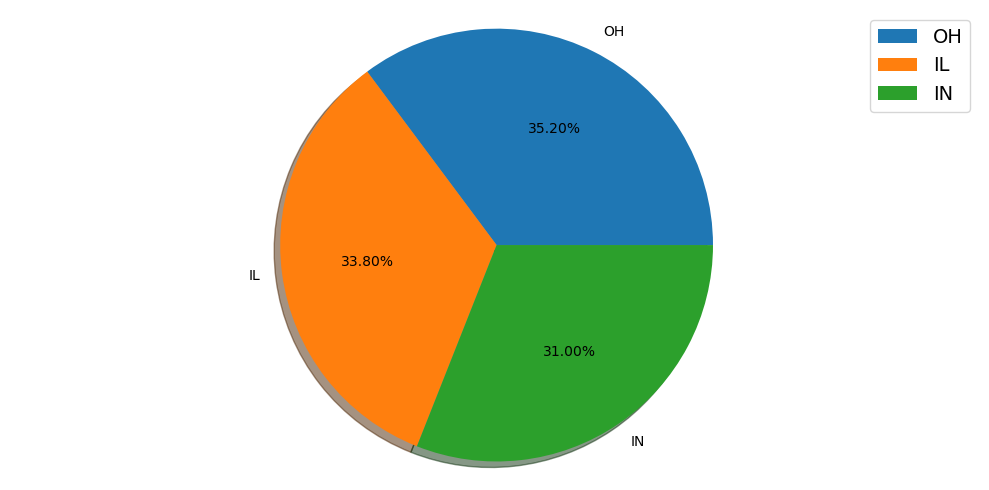

Pie plot for the column: insured_sex


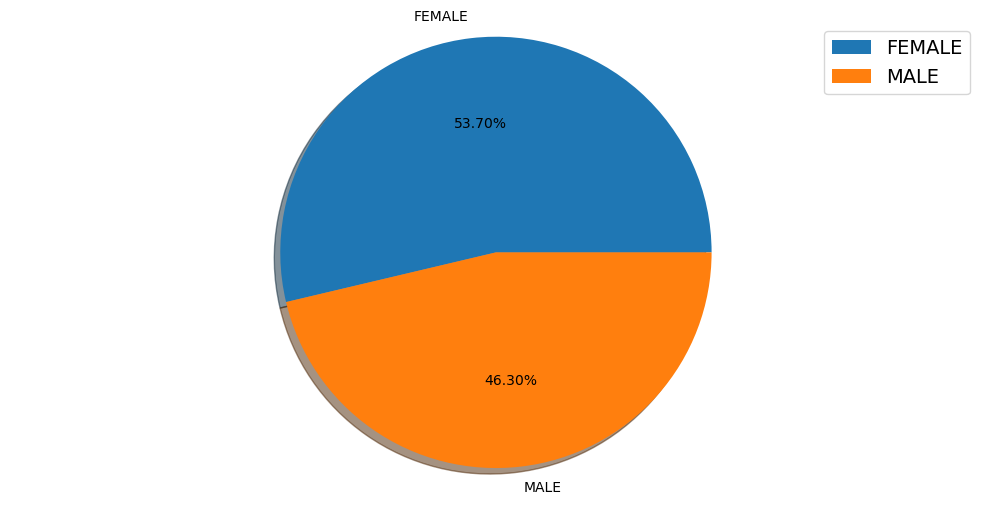

Pie plot for the column: insured_education_level


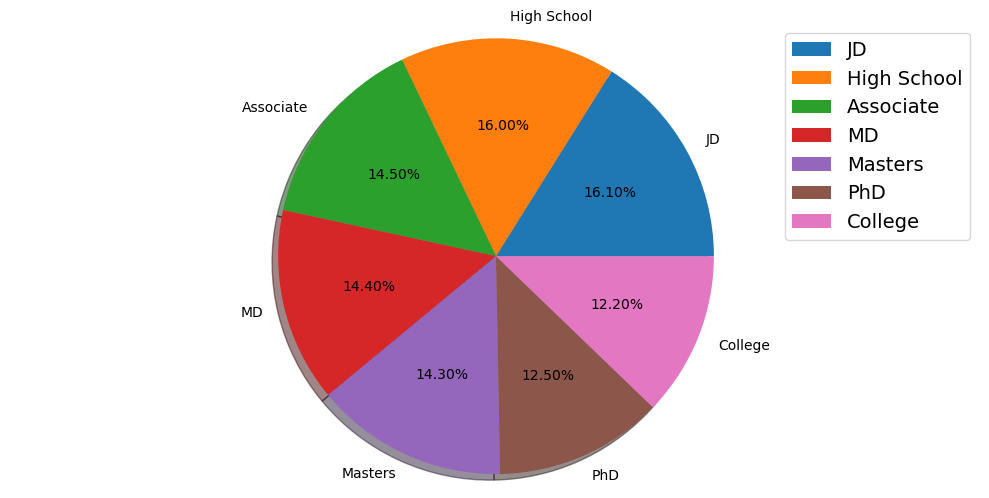

Pie plot for the column: insured_relationship


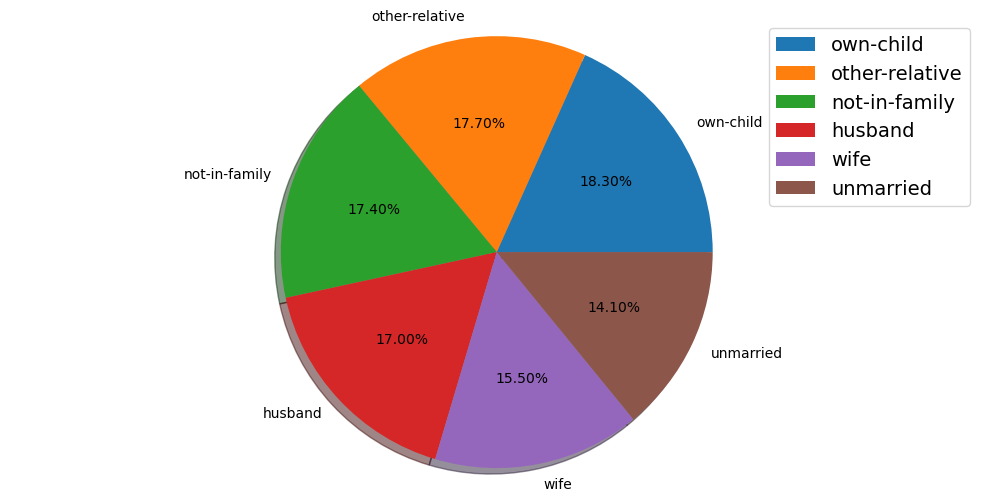

Pie plot for the column: incident_type


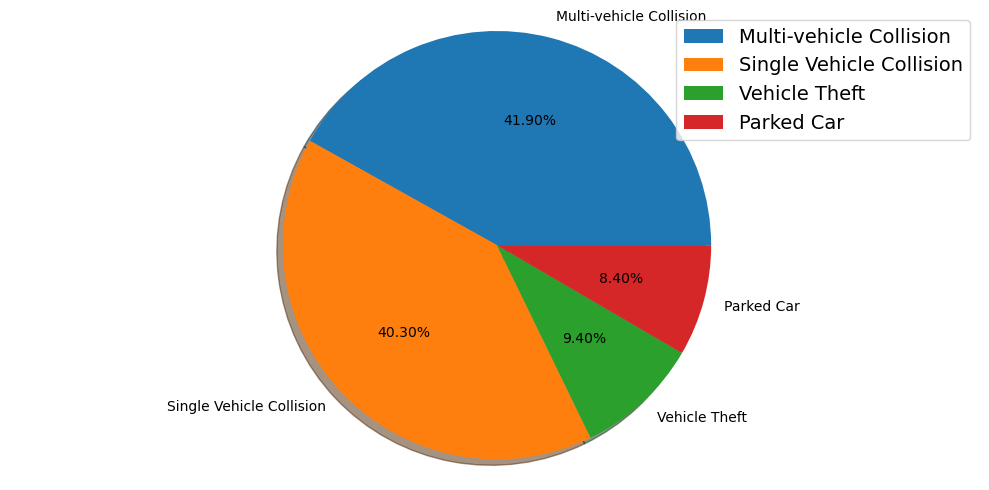

Pie plot for the column: collision_type


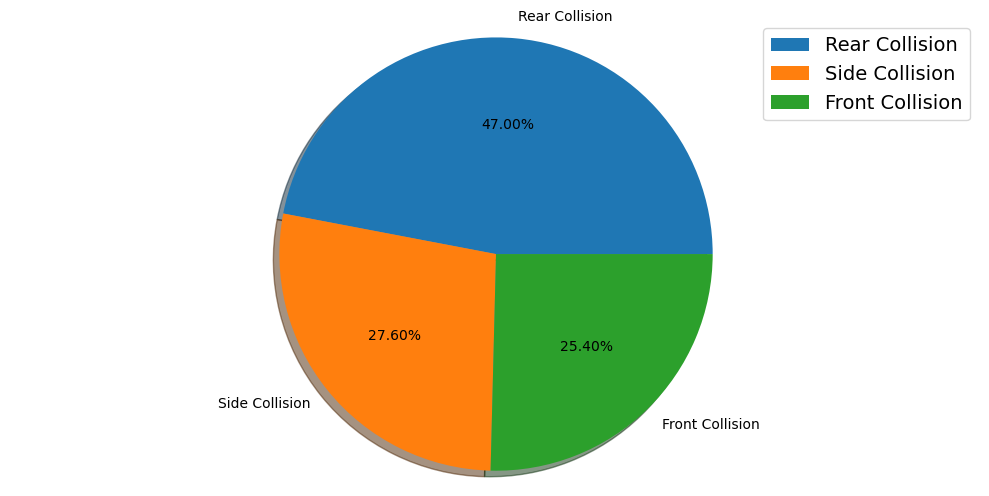

Pie plot for the column: property_damage


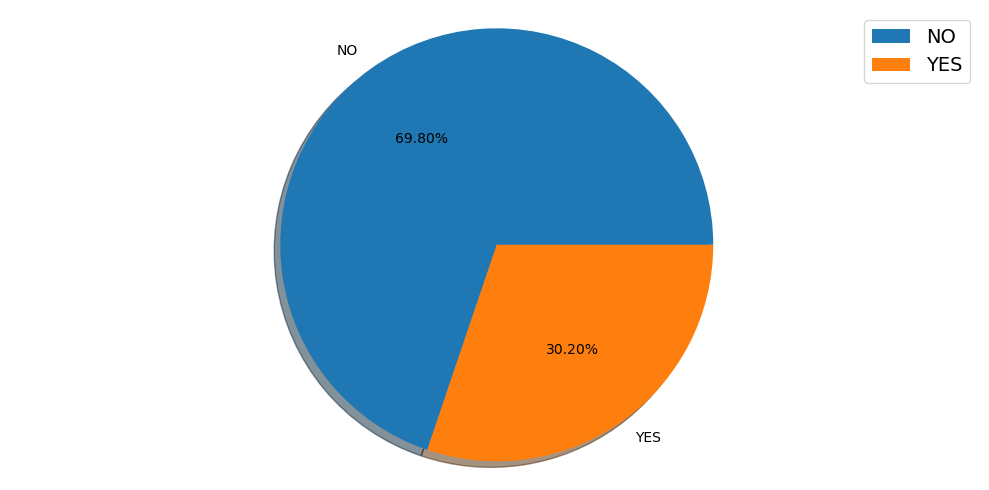

Pie plot for the column: police_report_available


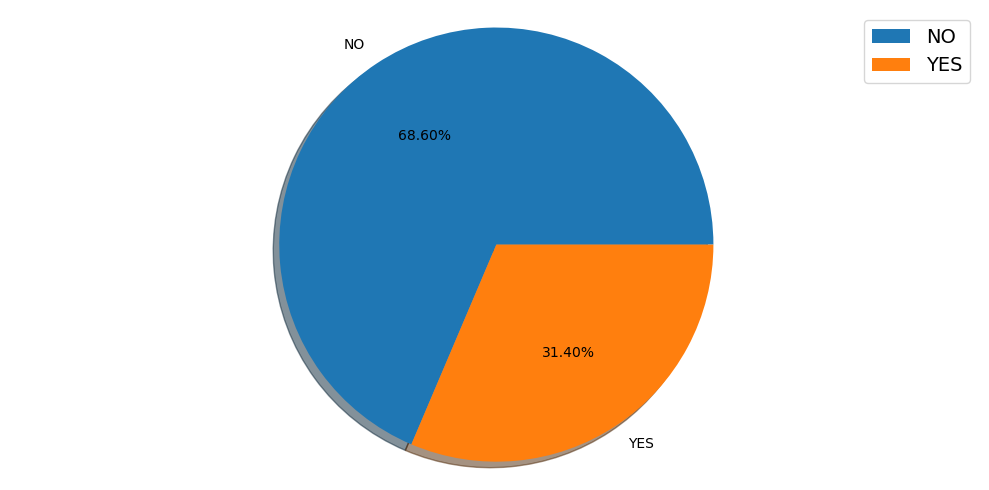

In [38]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['policy_state', 'insured_sex', 'insured_education_level','insured_relationship', 'incident_type','collision_type','property_damage','police_report_available']

plotnumber=1
for j in df[cols1]:
    print(f"Pie plot for the column:", j)
    generate_pie(df[j])

Above are the pie plots for some of the categorical columns. From the above pie plots we can observe the following things:

The types of the policies claimed by the customers are almost same but still the policy state type HO has bit high counts and the type IL has bit less count. Both male and female have insurance but the count for Female is higher than Male counts. The count is pretty much same for all the education level but still the people who have completed their college and PhD have less count compared to others. Similar to insured education, insured relationship is also almost equally distributed. While looking at the incident type, Multi-vehicle collision and Single Vehicle Collision have pretty much similar counts of around 41.9% and 40.3%. But the count is very less in Parked car and Vehicle Theft. The collision type has 3 different types . In this the count is high in Rear collision and the other two types have almost equal counts. As we observe the propert damage plot, around 69.8% of the people did not face any property damage while 30.2% of the people faced the property damage. About 68.6% of the people produced the police reports while 31.4% of the people didn't submit any police reports

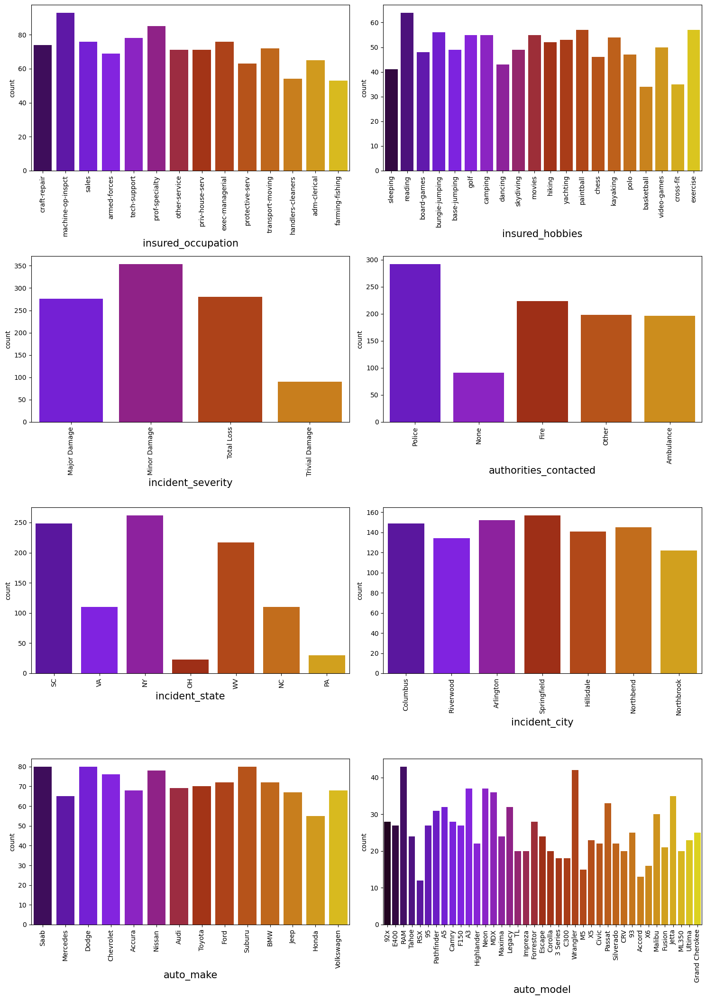

In [39]:
cols2 = ['insured_occupation', 'insured_hobbies', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city','auto_make', 'auto_model']

plt.figure(figsize=(15,25),facecolor='white')
plotnumber=1
for column in cols2:
    if plotnumber:
        ax=plt.subplot(5,2,plotnumber)
        sns.countplot(df[column],palette="gnuplot")
        plt.xticks(rotation=90)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

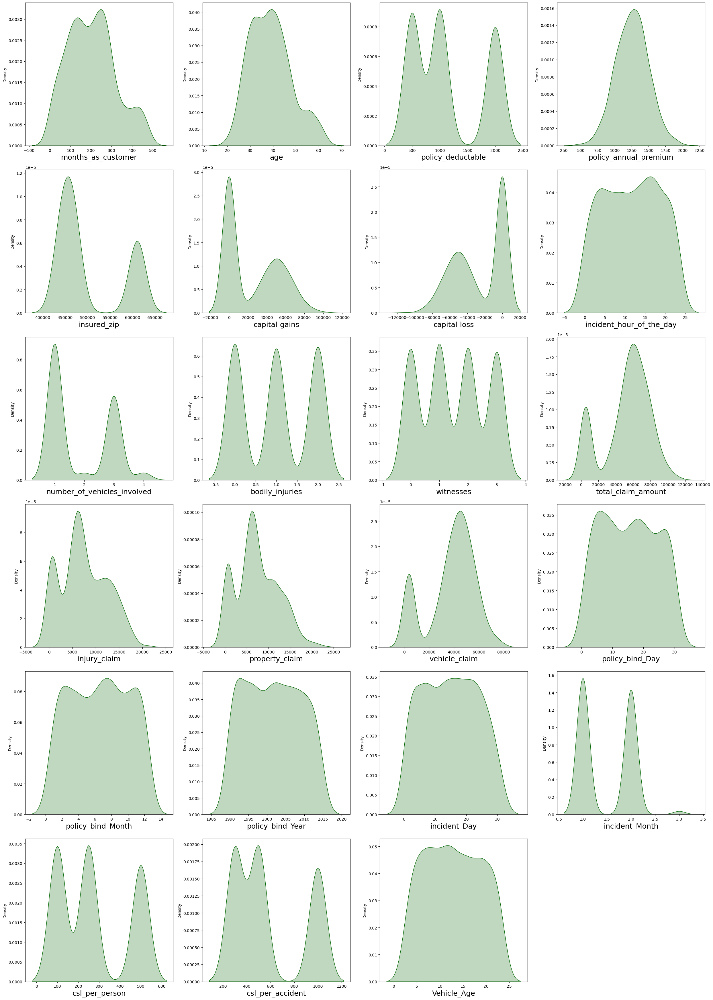

In [40]:
# Checking how the data has been distriubted in each column
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="darkgreen",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

Above are the distribution plots for all the numerical columns. From the distplots we can observe the following things:

The data is normally distributed in most of the columns. Some of the columns like capital gains and incident months have mean value greater than the median, hence they are skewed to left. The data in the column capital loss is skewed to right since the median is greater than the mean. We will remove the skewness using appropriate methods in the later part.

# Bivariate Analysis

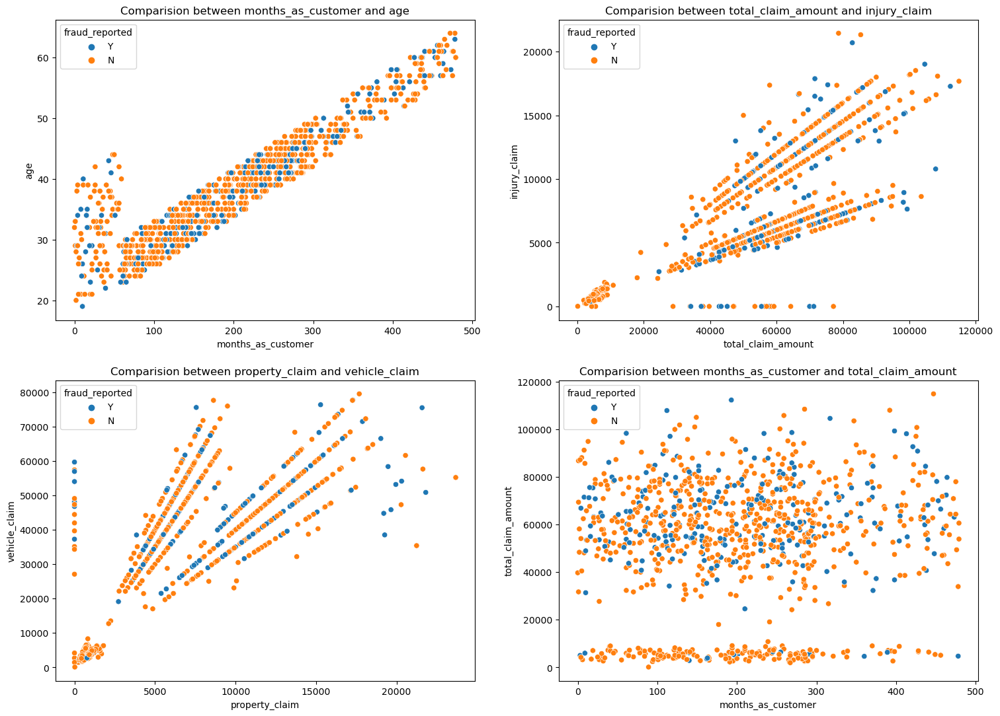

In [41]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

From the above scatter plot we can observe the following things:

There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in hits case. In the second graph we can observe the positive linear relation, as total claim amount increases, injury claim is also increases. Third plot is also same as second one that is as the property claim increases, vehicle claim also increases. In the fourth plot we can observe the data is scattered and there is no much relation between the features.

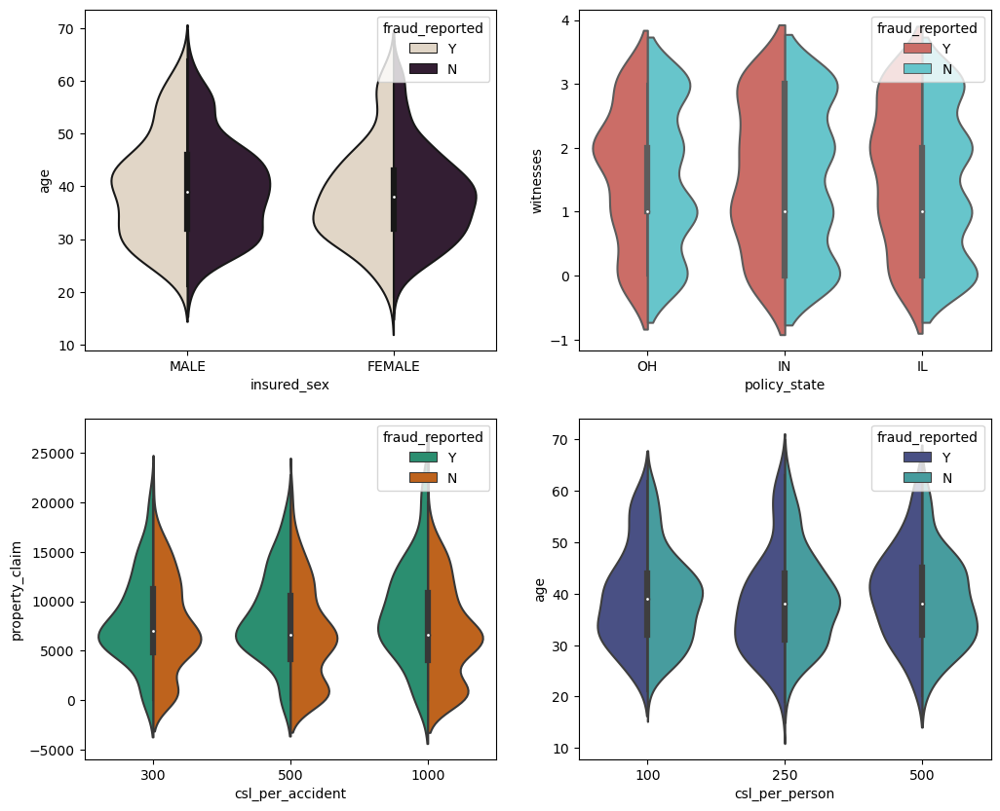

In [42]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,palette="ch:.25",hue="fraud_reported",split=True)

# Comparing policy_state and witnesses
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True,palette="hls")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='csl_per_accident',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True,palette="Dark2")

# Comparing csl_per_person and age
sns.violinplot(x='csl_per_person',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True,palette="mako")
plt.show()

The fraud report is high for both the males females having age between 30-45. The people who own the policy state "IN" have high fraud report. The person who has csl per accident insurance by claiming property in the range 5000-15000 have the fraud report. The csl_per_person with age 30-45 are facing the fraudulent reports.

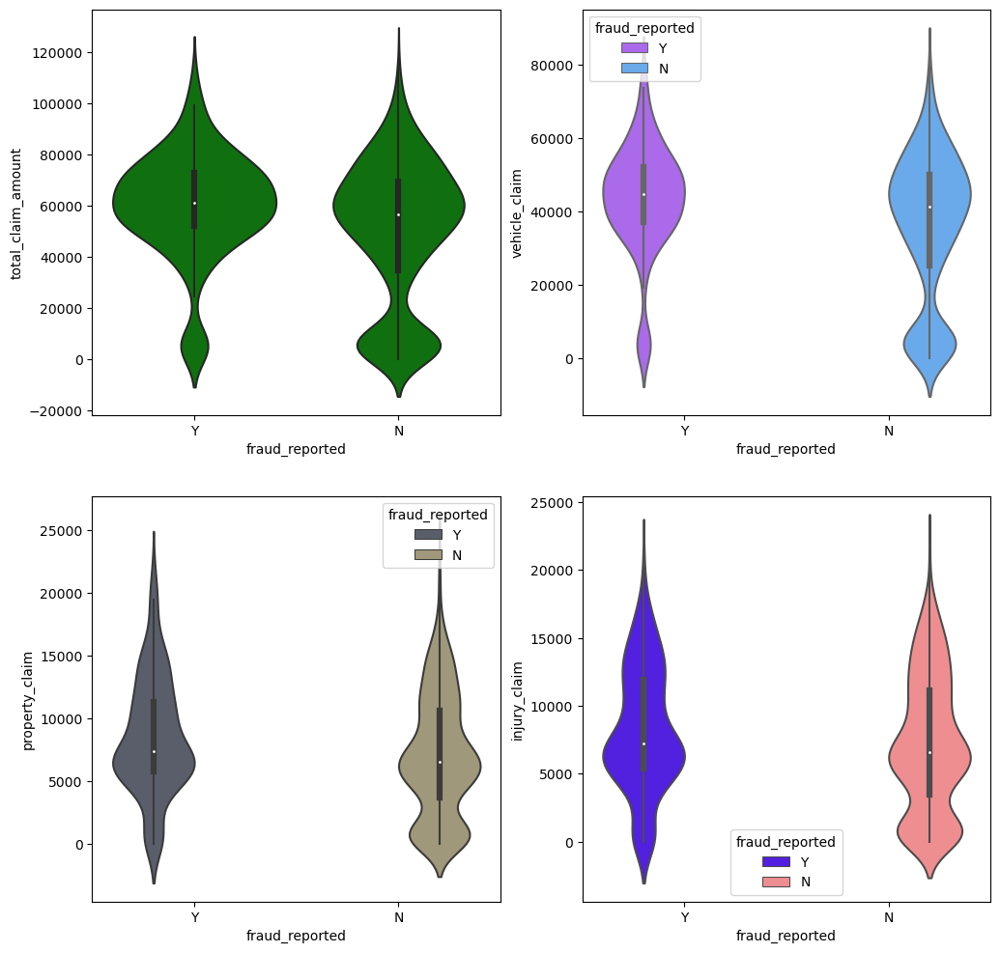

In [43]:
fig,axes=plt.subplots(2,2,figsize=(12,12))

# Comparing insured_sex and age
sns.violinplot(x='fraud_reported',y='total_claim_amount',ax=axes[0,0],data=df,color="g")

# Comparing policy_state and witnesses
sns.violinplot(x='fraud_reported',y='vehicle_claim',ax=axes[0,1],data=df,hue="fraud_reported",palette="cool_r")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='fraud_reported',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",palette="cividis")

# Comparing csl_per_person and age
sns.violinplot(x='fraud_reported',y='injury_claim',ax=axes[1,1],data=df,hue="fraud_reported",palette="gnuplot2")
plt.show()

Most of the fraud reports found when the total claimed amount is 50000-70000. The fraud report is high when the claimed vehicle is between 37000-57000. The fraud reports is high when the property claimed is between 5200-8500. Most fraud reported when injury claim are between 5000 to 8000.

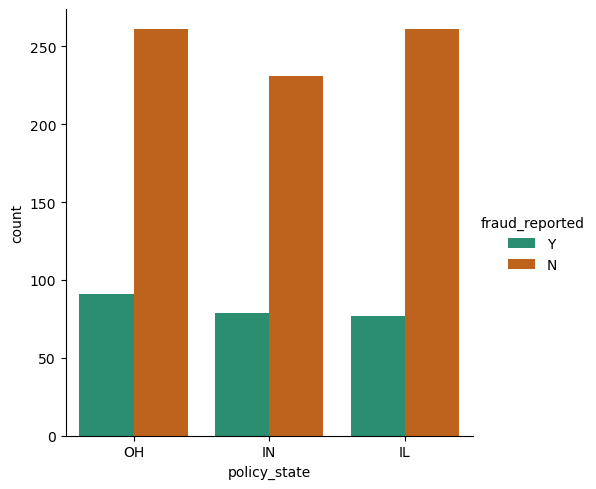

In [44]:
# Comparing policy_state and fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="Dark2")
plt.show()

Fraud report is bit high in the "OH" policy state.

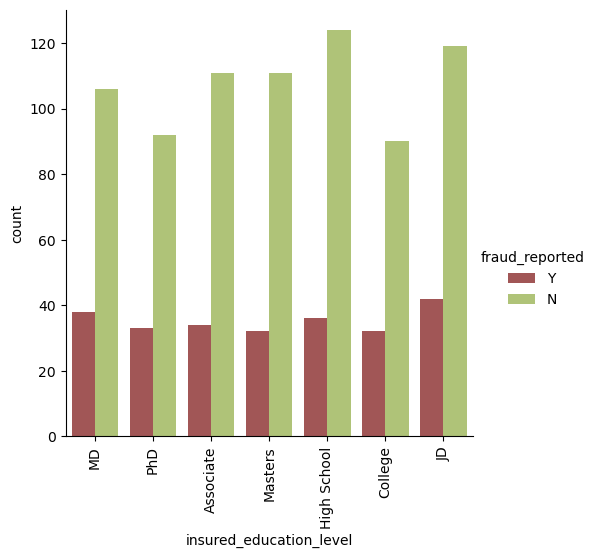

In [45]:
# Comparing insured_education_level and fraud_reported

sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="tab20b_r")
plt.xticks(rotation=90)
plt.show()

The fraudulent level is very less for the people who have high school education and the people who have completed their "JD" education have high fraud report. The people who have high insured education are facing insurance fraudulent compared to the people with less insured education level.

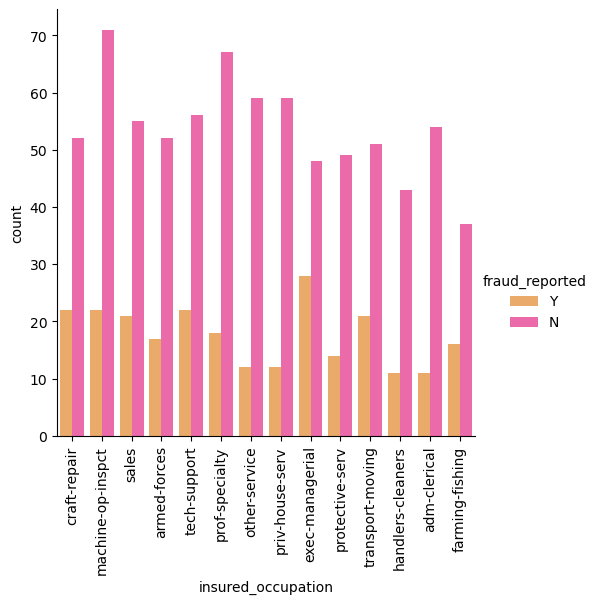

In [46]:
# Comparing insured_occupation and fraud_reported
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="spring_r")
plt.xticks(rotation=90)
plt.show()

The people who are in the position exec-managerials have high fraud reports compared to others.

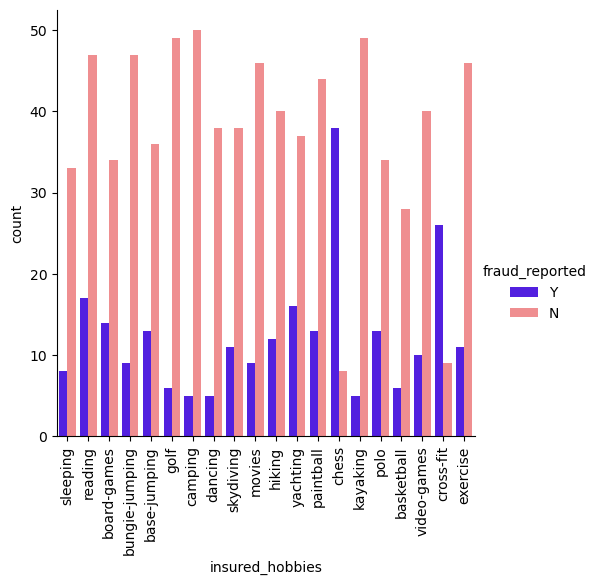

In [47]:
# Comparing insured_hobbies and fraud_reported
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="gnuplot2")
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the people who have the hobby of playing chess and cross fit.

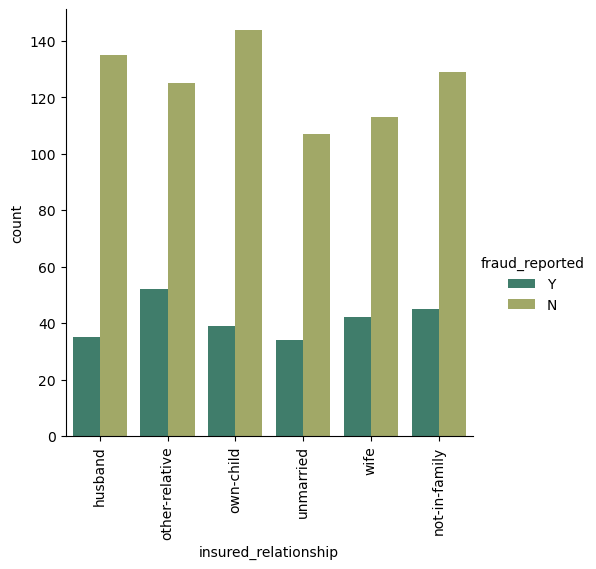

In [48]:
# Comparing insured_relationship and fraud_reported
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette="gist_earth")
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the customers who have other relative and it is very less for unmarried people.

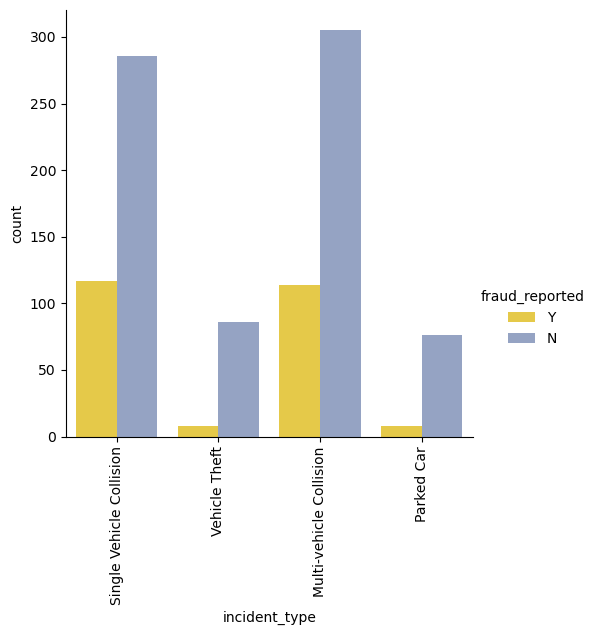

In [49]:
# Comparing incident_type and fraud_reported
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="Set2_r")
plt.xticks(rotation=90)
plt.show()

In Multivehicle collission and single vehicle collision, the fraud report is very high compared to others.

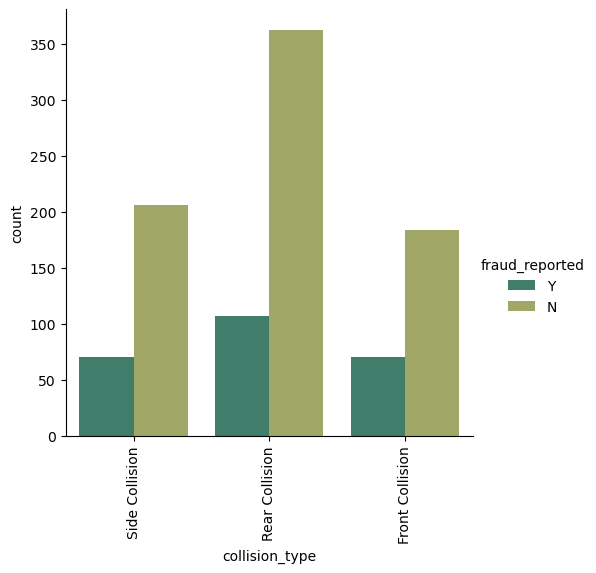

In [50]:
# Comparing collision_type and fraud_reported
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="gist_earth")
plt.xticks(rotation=90)
plt.show()

The fraud level is high in the collision type Rear Collision and other two collision type have average reports.

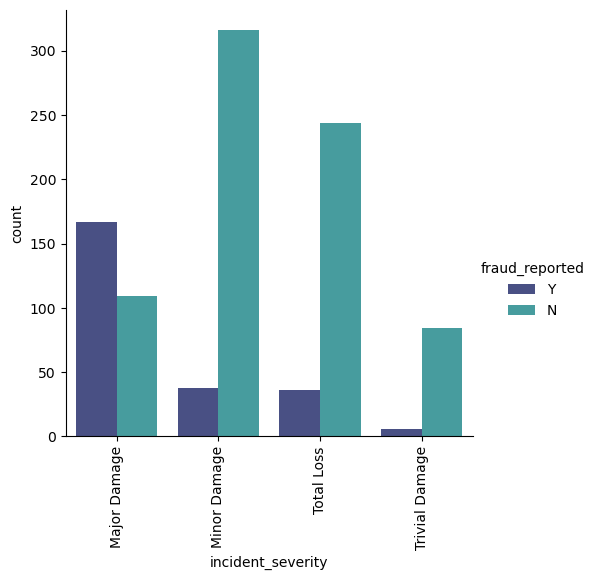

In [51]:
# Comparing incident_severity and fraud_reported
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="mako")
plt.xticks(rotation=90)
plt.show()

The fraud report is high in Major damage incident severity and for Trivial Damage the report is less compared to others.

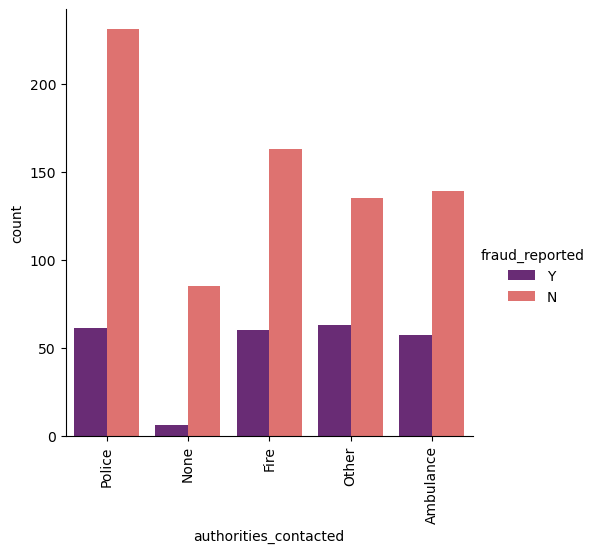

In [52]:
# Comparing authorities_contacted and fraud_reported
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="magma")
plt.xticks(rotation=90)
plt.show()

The police contacted cases are very high and the fraud report is in equal for all the authorities except None.

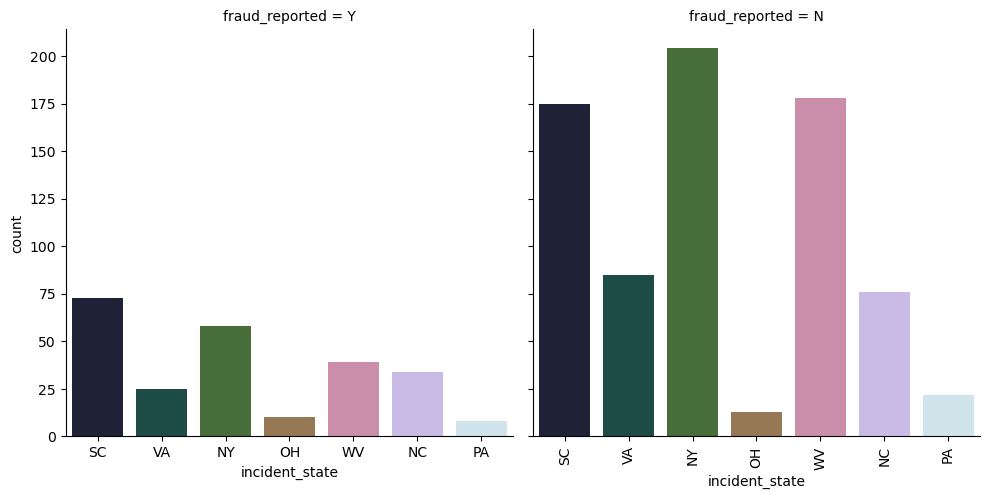

In [53]:
# Comparing incident_state and fraud_reported
sns.factorplot('incident_state',kind='count',data=df,col='fraud_reported',palette="cubehelix")
plt.xticks(rotation=90)
plt.show()

The state SC has high fraud reports compared to other states.

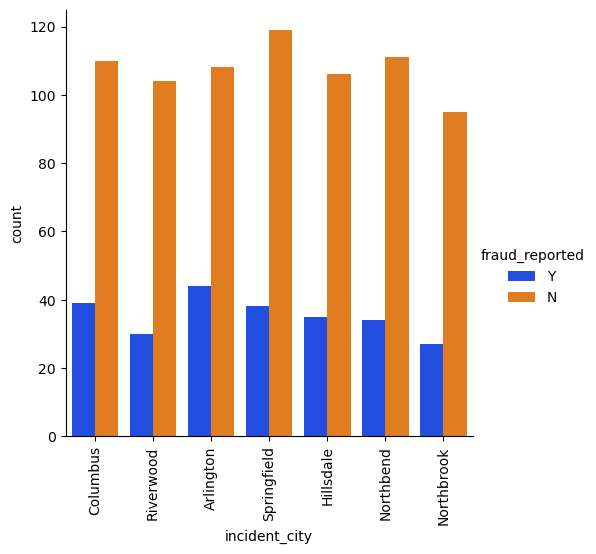

In [55]:
# Comparing incident_city and fraud_reported
sns.catplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="bright")
plt.xticks(rotation=90)
plt.show()

The cities Riverwood and Northbrook have very less fraud reports compared to others.

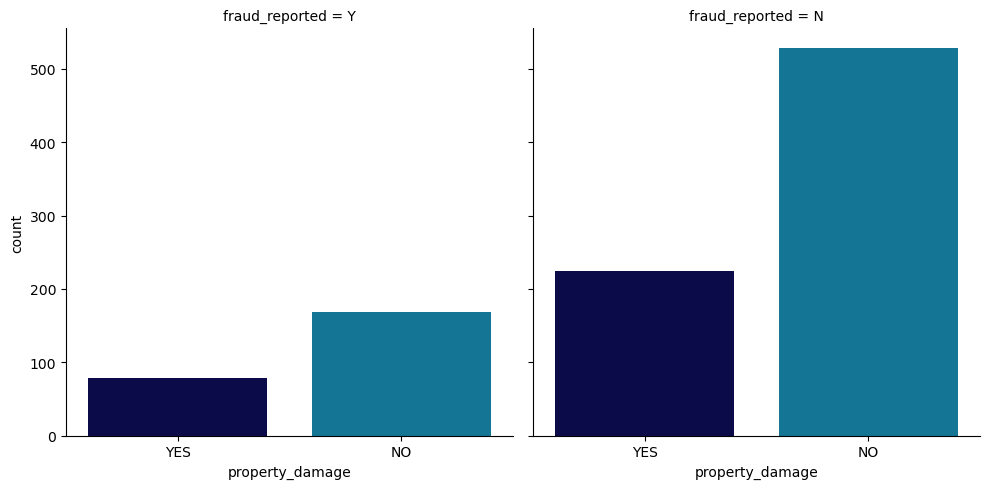

In [56]:
# Comparing property_damage and fraud_reported
sns.factorplot('property_damage',kind='count',data=df,col='fraud_reported',palette="ocean")
plt.show()

The customers who do not have any property damage case they have high fraud reports.

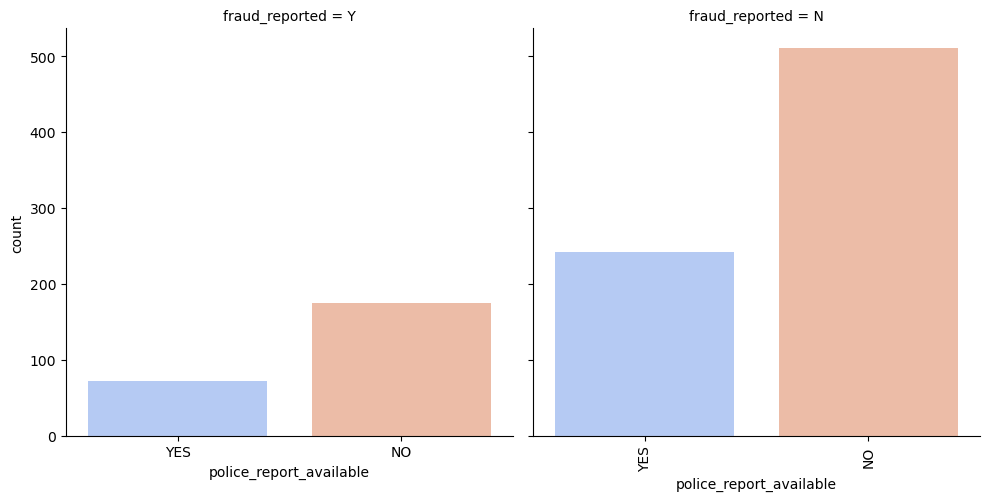

In [57]:
# Comparing police_report_available and fraud_reported
sns.factorplot('police_report_available',kind='count',data=df,col='fraud_reported',palette="coolwarm")
plt.xticks(rotation=90)
plt.show()

If there is no police report available then the fraud report is very high.

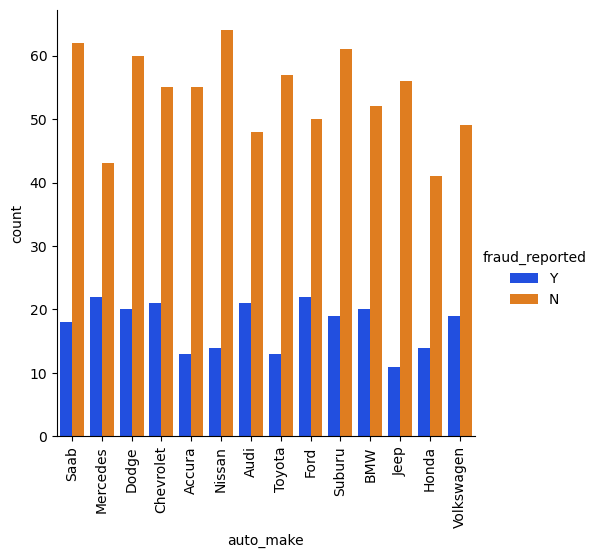

In [58]:
# Comparing auto_make and fraud_reported
sns.catplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="bright")
plt.xticks(rotation=90)
plt.show()

In all the auto make cases the fraud report is almost same.

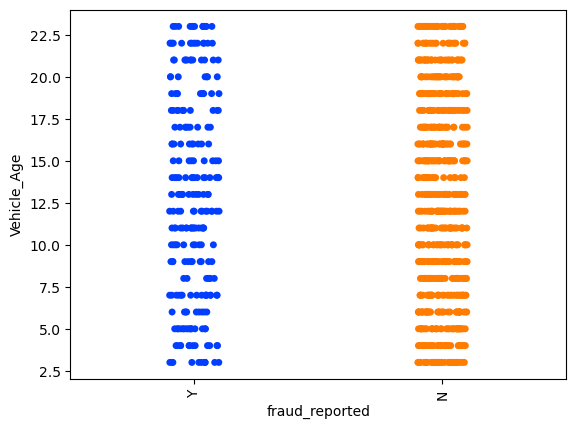

In [59]:
# Comparing  Vehicle_Age and fraud_reported
sns.stripplot(y='Vehicle_Age',x='fraud_reported',data=df,palette="bright")
plt.xticks(rotation=90)
plt.show()

There is no significant difference between the features.

# Multivariate Analysis

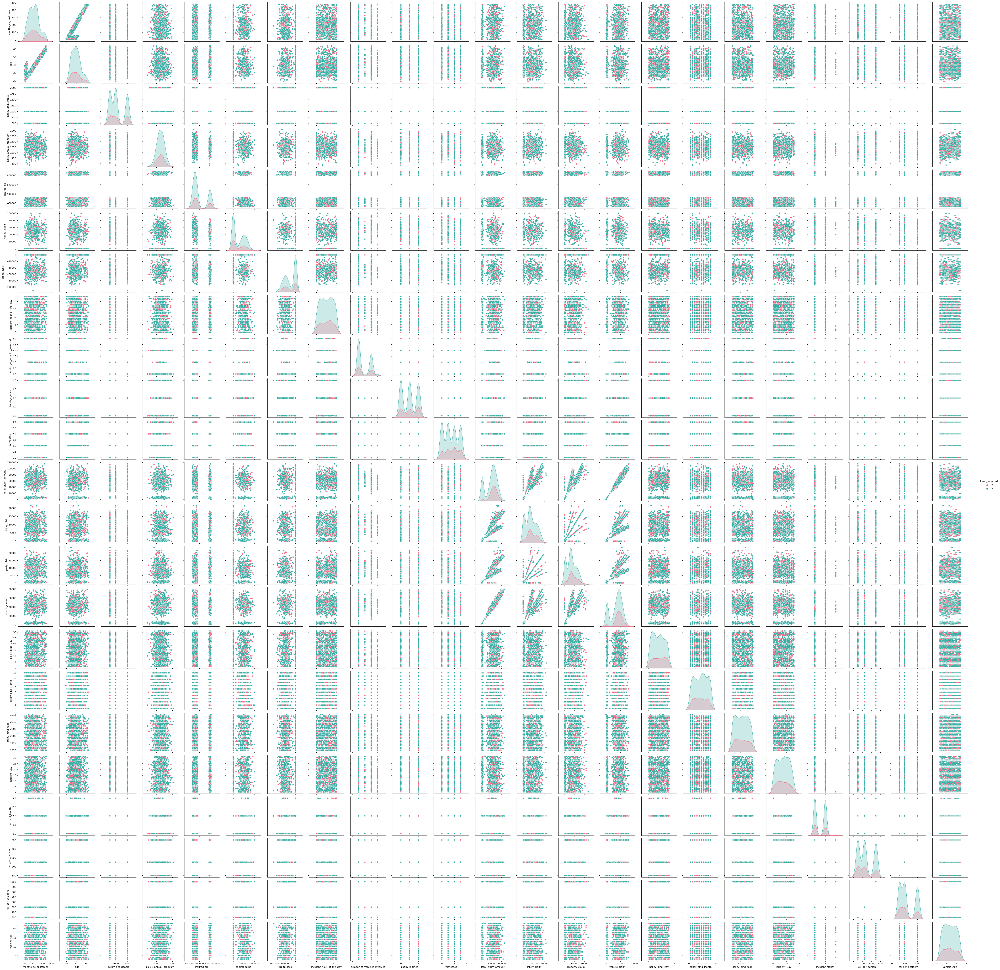

In [60]:
sns.pairplot(df,hue="fraud_reported",palette="husl")
plt.show()

In the pairplot we can see the relationbetween each variable with respect to other variables

# Identifying the outliers

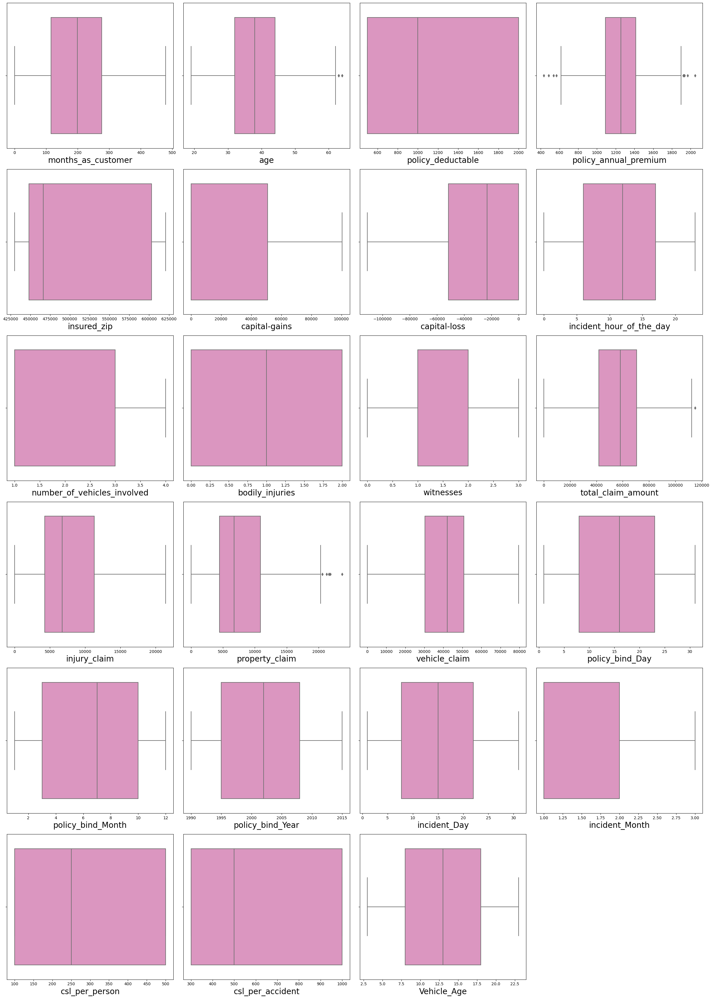

In [61]:
# Let's check the outliers by ploting box plot

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],palette="Set2_r")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

We can find the outliers in the following columns:

age policy_annual_premium , total_claim_amount , property_claim and incident_month.

These are the numerical columns which contains outliers. Removing the outliers in these columns using Zscore method.

# Removing outliers

In [62]:
# Feature containing outliers
features = df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_Month']]

z=np.abs(zscore(features))

z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_Month
0,0.990836,0.616705,0.714257,1.165505,0.947587
1,0.334073,0.242521,1.807312,1.372696,0.947587
2,1.088913,0.642233,0.686362,0.736072,0.962871
3,0.224613,0.652886,0.403135,0.219722,0.947587
4,0.552994,1.341980,1.753121,1.399654,0.962871
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.962871
996,0.224613,0.739141,2.111466,2.214794,0.947587
997,0.541611,0.520739,0.558507,0.020826,0.947587
998,2.523284,0.411866,0.219110,0.451976,0.962871


In [63]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)] 
new_df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,...,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,...,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,430632,FEMALE,PhD,sales,board-games,...,RAM,N,6,9,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,...,Tahoe,Y,25,5,1990,10,1,250,500,4
4,228,44,IL,1000,1583.91,610706,MALE,Associate,sales,board-games,...,RSX,N,6,6,2014,17,2,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,431289,FEMALE,Masters,craft-repair,paintball,...,Accord,N,16,7,1991,22,2,500,1000,12
996,285,41,IL,1000,1436.79,608177,FEMALE,PhD,prof-specialty,sleeping,...,Passat,N,5,1,2014,24,1,100,300,3
997,130,34,OH,500,1383.49,442797,FEMALE,Masters,armed-forces,bungie-jumping,...,Impreza,N,17,2,2003,23,1,250,500,22
998,458,62,IL,2000,1356.92,441714,MALE,Associate,handlers-cleaners,base-jumping,...,A5,N,18,11,2011,26,2,500,1000,20


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

# Percentage data loss:

In [64]:
loss_percent=(1000-996)/1000*100
print(loss_percent,'%')

0.4 %


After removing the outliers we are checking the data loss percentage by comparing the rows in our original data set and the new data set

0.4% data loss is acceptable

# Checking skewness in the data

In [65]:
# Checking the skewness
new_df.skew().sort_values()

vehicle_claim                 -0.619755
total_claim_amount            -0.593473
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
policy_bind_Month             -0.021269
bodily_injuries                0.011117
witnesses                      0.025758
policy_annual_premium          0.032042
incident_Day                   0.038514
Vehicle_Age                    0.049276
policy_bind_Day                0.057251
policy_bind_Year               0.058499
incident_Month                 0.260283
injury_claim                   0.267970
property_claim                 0.357130
months_as_customer             0.359605
csl_per_person                 0.413713
policy_deductable              0.473229
age                            0.474526
capital-gains                  0.478850
number_of_vehicles_involved    0.500364
csl_per_accident               0.609316
insured_zip                    0.825568
dtype: float64

The following features contains the skewness

total_claim_amount vehicle_claim incident_Month csl_per_accident

# Removing Skewness using yeo-johnson method

In [66]:
# Removing skewness using yeo-johnson method to get better prediction

skew = ["total_claim_amount","vehicle_claim","incident_Month","csl_per_accident"]

transf = PowerTransformer(method='yeo-johnson')

In [67]:
new_df[skew] = transf.fit_transform(new_df[skew].values)
new_df[skew].head()

,total_claim_amount,vehicle_claim,incident_Month,csl_per_accident
0,0.717556,0.754553,-0.966028,0.052612
1,-1.777785,-1.787353,-0.966028,0.052612
2,-0.716483,-0.820820,0.996033,-1.174021
3,0.392931,0.678427,-0.966028,0.052612
4,-1.730555,-1.740710,0.996033,1.313327


In [68]:
# Checking skewness after using yeo-johnson ethod
new_df[skew].skew().sort_values()

vehicle_claim        -0.521354
total_claim_amount   -0.508953
incident_Month        0.107284
csl_per_accident      0.110964
dtype: float64

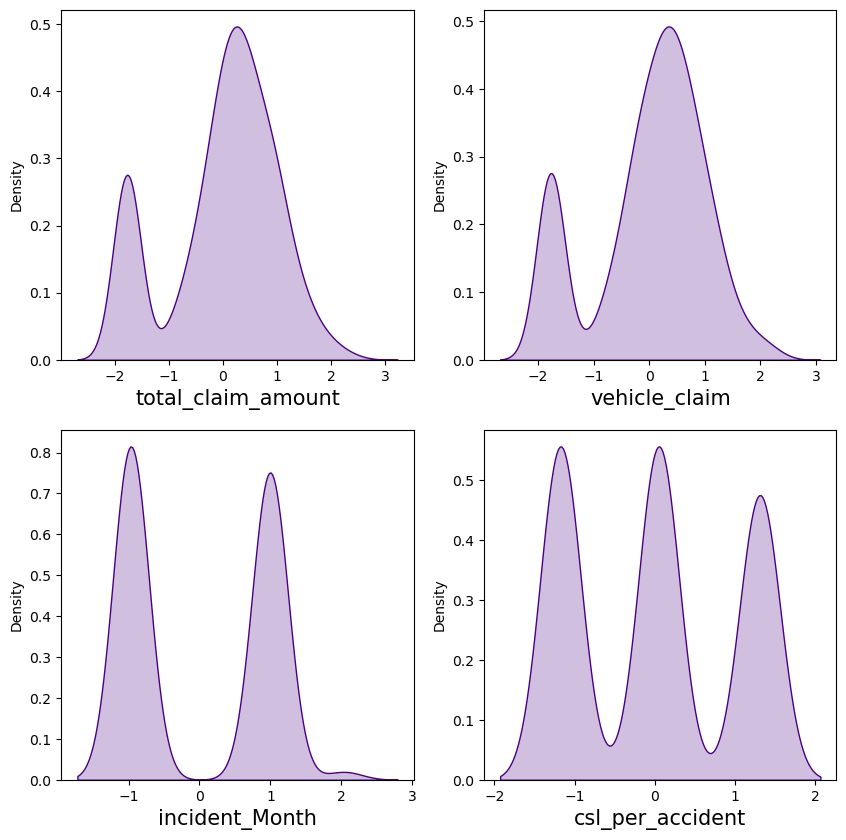

In [69]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(10,10), facecolor='white')
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(new_df[column],color='indigo',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

The data distribution looks better after removing the skewness compared to the previous data.

# Encoding the categorical columns using Label Encoding

In [70]:
LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [71]:
new_df[categorical_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


The categorical columns have been converted into numerical columns by using label encoding.

# Correlation between the target variable and independent variables using HEAT map

In [72]:
# Checking the correlation between features and the target
cor = new_df.corr()
cor

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.023501,0.059002,-0.000848,0.005365,-0.092575,...,0.002908,0.020966,0.058051,-0.004430,-0.046010,-0.004740,-0.049327,-0.022063,-0.022928,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.030629,0.072900,0.001485,0.014030,-0.080587,...,0.016258,0.012408,0.058530,0.005683,-0.035505,0.000843,-0.042259,-0.012844,-0.012459,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,0.007686,-0.019294,-0.032551,-0.031016,-0.040215,...,-0.024513,0.028864,0.011078,0.044056,-0.005709,0.024963,0.015844,-0.005866,-0.000653,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,0.007891,-0.011671,0.014571,-0.050024,0.005134,...,-0.003597,0.015833,0.001948,-0.026390,-0.048465,-0.023898,-0.030969,0.006634,0.006179,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.048287,0.041830,-0.021475,0.030963,-0.014376,...,-0.034998,-0.010174,-0.040755,-0.003040,0.001650,0.027156,-0.048497,0.028569,0.030755,0.040439
insured_zip,0.023501,0.030629,0.007686,0.007891,0.048287,1.000000,-0.036644,0.016612,-0.065517,0.000113,...,0.025402,0.018075,-0.045378,0.027516,-0.002393,0.029747,-0.022927,0.001157,0.002777,0.036520
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,-0.036644,1.000000,0.007473,-0.009257,-0.019600,...,-0.017679,0.032173,0.043745,-0.001689,-0.031981,0.002369,-0.023193,-0.019001,-0.008959,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.016612,0.007473,1.000000,-0.021502,0.022806,...,0.050878,0.011520,0.043706,-0.080717,0.017801,-0.035547,-0.053397,0.011093,0.010425,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.065517,-0.009257,-0.021502,1.000000,-0.009818,...,0.020878,0.003335,0.011567,-0.013004,-0.025282,-0.019689,-0.015159,0.018978,0.019575,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,0.000113,-0.019600,0.022806,-0.009818,1.000000,...,0.031208,-0.047983,0.018190,0.020865,-0.013819,0.019566,-0.029398,-0.013322,-0.007772,0.015606


This gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map.

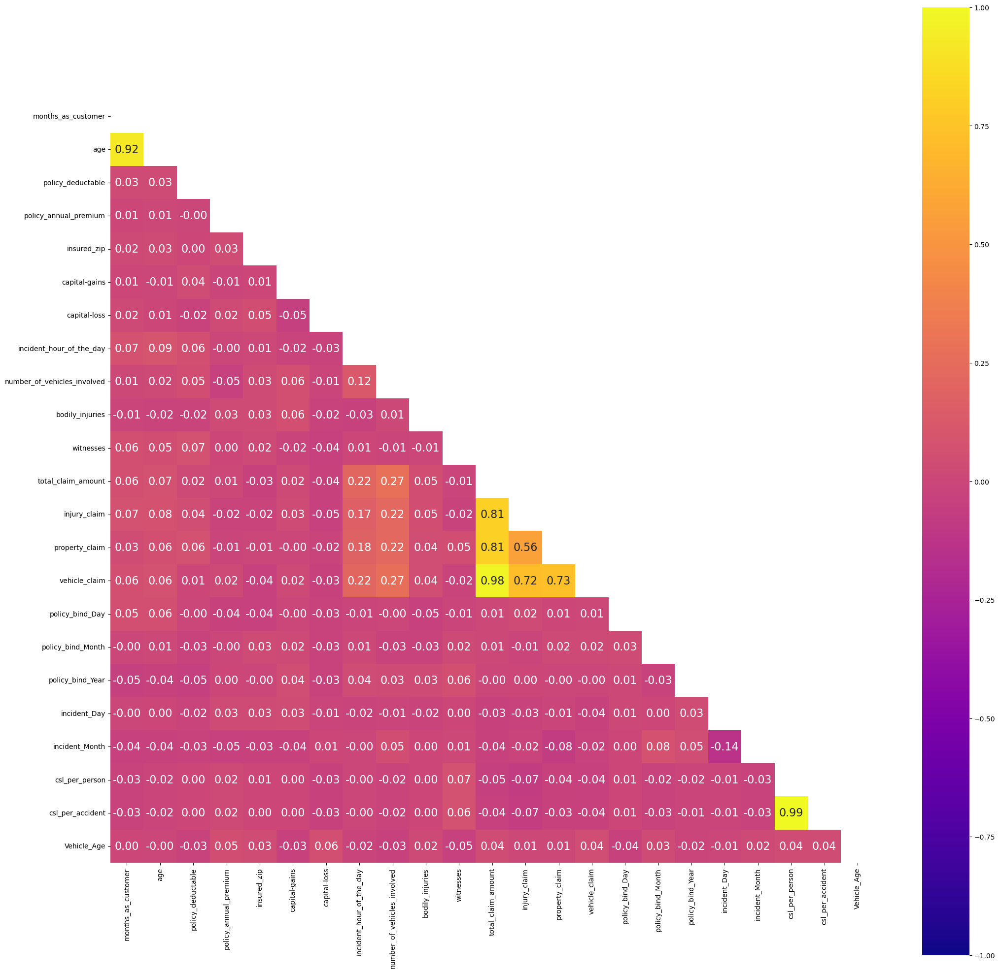

In [73]:
# Visualizing the correlation matrix by plotting heat map.
plt.style.use('seaborn-pastel')

upper_triangle = np.triu(df.corr())
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.2f', 
            annot_kws={'size':16}, cmap="plasma", mask=upper_triangle)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between one feature to other.

This heatmap contains both positive and negative correlation.

There is very less correlation between the target and the label. We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem. We will check the VIF value to overcome this multicollinearity problem.

# Visualizing the correlation between label and features using bar plot

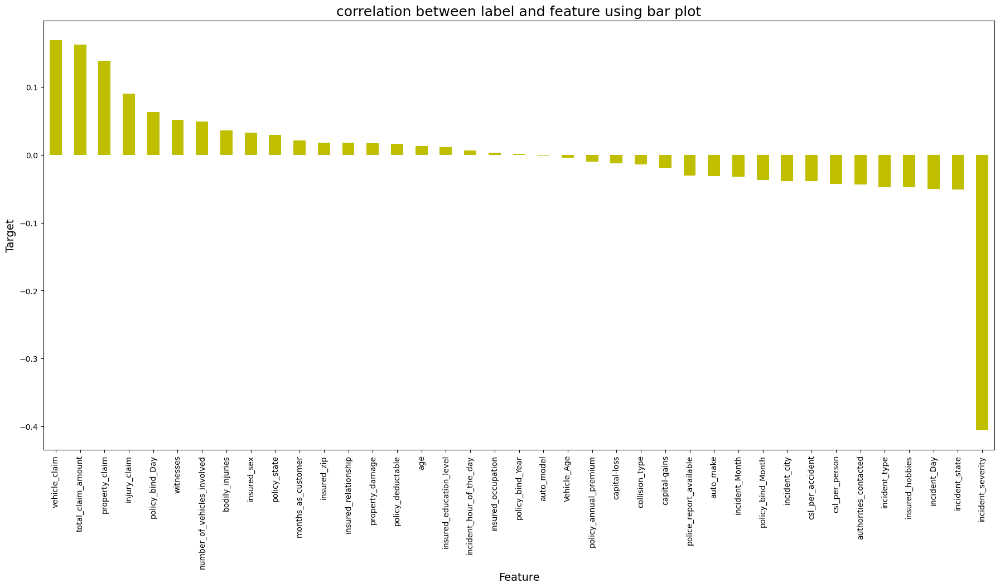

In [74]:
plt.figure(figsize=(22,10))
new_df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='y')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

Since the heatmap was not able to give us a clearer picture on positive and negative correlation columns we have generated this bar plot and we see that more than half the feature columns are positively correlated with our target label while all the remaining features are negatively correlated with our label column. This indicates that they are all required for the prediction of our classification label.

# Splitting the dataset into Features and Target

In [75]:
x = new_df.drop("fraud_reported", axis=1)
y = new_df["fraud_reported"]

In [76]:
# Dimension of x
x.shape

(996, 39)

In [77]:
# Dimension of y
y.shape

(996,)

# Feature Scaling using Standard Scaler

In [78]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_make,auto_model,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.074671,0.987190,1.186130,-0.224722,0.621371,-0.486746,1.075102,0.531088,-1.162296,1.280299,...,0.857248,-1.644810,0.179080,0.980399,1.686176,1.153049,-0.966028,-0.137684,0.052612,0.182338
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,-0.458176,1.075102,0.531088,-0.166257,0.928186,...,0.360986,-0.657437,1.315157,-0.163352,0.599693,0.690948,-0.966028,-0.137684,0.052612,-0.316587
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.982961,-0.930144,1.557206,1.078792,-1.360550,...,-0.631538,0.958263,-1.070604,0.694461,-0.215170,0.806473,0.996033,-1.066352,-1.174021,-0.316587
3,0.448397,0.221000,-1.222403,1.409024,0.658123,1.497902,-0.930144,1.557206,-1.411305,-1.360550,...,-0.879669,1.317308,1.087942,-0.449290,-1.573274,-0.579830,-0.966028,-0.137684,0.052612,-1.480744
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.534091,1.075102,-1.521148,1.078792,-1.360550,...,-1.624063,1.048024,-1.070604,-0.163352,1.686176,0.228847,0.996033,1.410096,1.313327,-0.649203


The data has now been scaled.

In the heat map we have found some features having high correlation between each other which means multicollinearity exists. so let's check the VIF value to solve multicollinearity problem.

# Checking Multicollinearity

In [79]:
# Finding varience inflation factor in each scaled column
def calc_vif(x):
    vif = pd.DataFrame()
    vif["Features"] = x.columns
    vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [80]:
calc_vif(x)

,Features,VIF values
0,months_as_customer,6.858483
1,age,6.858891
2,policy_state,1.034189
3,policy_deductable,1.044427
4,policy_annual_premium,1.042094
5,insured_zip,1.035490
6,insured_sex,1.038912
7,insured_education_level,1.053000
8,insured_occupation,1.021365
9,insured_hobbies,1.053101


We can observe some columns have VIF above 10 that means they are causing multicollinearity problem. Let's drop the feature having high VIF value amongst all the columns.

In [81]:
# Dropping total_claim_amount column as it contains high VIF value
x.drop(["total_claim_amount"],axis=1,inplace=True)

In [83]:
calc_vif(x)

,Features,VIF values
0,months_as_customer,6.856464
1,age,6.858869
2,policy_state,1.034115
3,policy_deductable,1.042817
4,policy_annual_premium,1.041143
5,insured_zip,1.031761
6,insured_sex,1.036023
7,insured_education_level,1.052991
8,insured_occupation,1.020836
9,insured_hobbies,1.051384


In [84]:
# Dropping csl_per_accident column
x.drop(["csl_per_accident"],axis=1,inplace=True)

In [85]:
calc_vif(x)

,Features,VIF values
0,months_as_customer,6.854234
1,age,6.856597
2,policy_state,1.032968
3,policy_deductable,1.042687
4,policy_annual_premium,1.040780
5,insured_zip,1.031615
6,insured_sex,1.030939
7,insured_education_level,1.052987
8,insured_occupation,1.020720
9,insured_hobbies,1.049982


Now we have overcome the multicollinearity issue as all the VIF values are less than 10 in all the columns.

In [86]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

Here we can observe the data is not balanced, since it is classification problem we will balance the data using oversampling method.

# SMOTE

In [90]:
!pip install -U imbalanced-learn
!pip install imblearn
!pip install imblearn
!pip install -c glemaitre imbalanced-learn
!pip install imblearn==0.0

     -------------------------------------- 226.0/226.0 kB 7.0 MB/s eta 0:00:00
     -------------------------------------- 298.0/298.0 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'glemaitre'


In [91]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [92]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

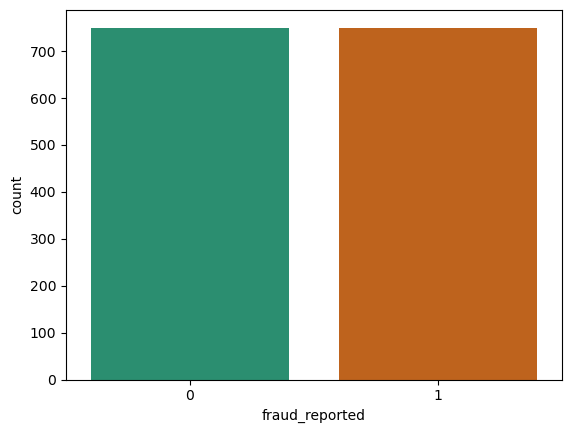

In [93]:
# Visualizing the data after oversampling
sns.countplot(y,palette="Dark2")

# Finding best random state

In [94]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
rf = RandomForestClassifier()

In [95]:
maxAccu=0
maxRS=0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    rf.fit(x_train, y_train)
    pred = rf.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9311111111111111  on Random_state  78


In [96]:
maxAccu=0
maxRS=0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state =i)
    rf.fit(x_train, y_train)
    pred = rf.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.93  on Random_state  14


# Feature importance bar graph

,Importance
Features,
incident_severity,0.211
insured_hobbies,0.060
vehicle_claim,0.045
injury_claim,0.039
authorities_contacted,0.034
property_claim,0.034
incident_state,0.032
insured_zip,0.030
witnesses,0.028


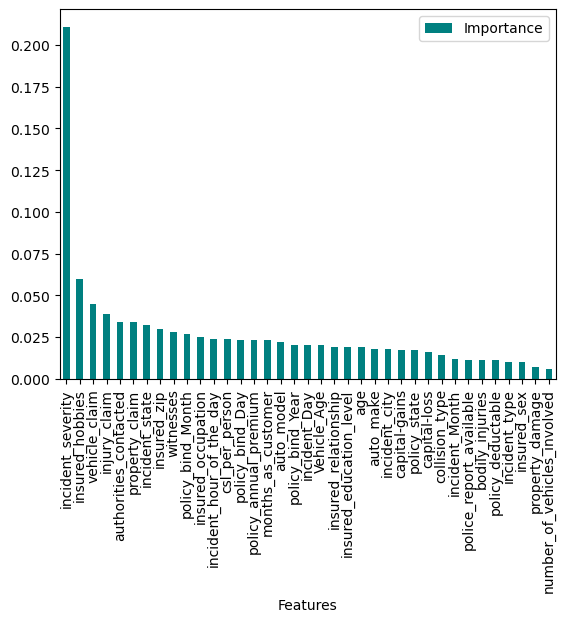

In [97]:
rf.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(rf.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances.plot.bar(color='teal')
importances

This bar plot shows us the importance of the features using random forest algorithm on predicting our Target variable.

# Creating train_test split

In [98]:
# Importing required libraries
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [99]:
# creating a function to run all the classifiers

def classifier(model, x, y):
    x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=80)
    
    # Training the model
    model.fit(x_train, y_train)
    
    # Predicting y_test
    pred = model.predict(x_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, x, y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

# Logistic Regression

In [100]:
model = LogisticRegression()
classifier(model, x, y)

Accuracy Score: 75.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.75      0.75       147
           1       0.76      0.76      0.76       153

    accuracy                           0.75       300
   macro avg       0.75      0.75      0.75       300
weighted avg       0.75      0.75      0.75       300

Cross Validation Score: 74.33333333333334

Accuracy Score - Cross Validation Score is 0.9999999999999858


# Naive Bayes

In [101]:
model = GaussianNB()
classifier(model, x, y)

Accuracy Score: 73.0

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.64      0.70       147
           1       0.70      0.82      0.76       153

    accuracy                           0.73       300
   macro avg       0.74      0.73      0.73       300
weighted avg       0.74      0.73      0.73       300

Cross Validation Score: 73.66666666666667

Accuracy Score - Cross Validation Score is -0.6666666666666714


# SVC Classifier

In [102]:
model = SVC(kernel='rbf')
classifier(model, x, y)

Accuracy Score: 85.66666666666667

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.81      0.85       147
           1       0.83      0.90      0.87       153

    accuracy                           0.86       300
   macro avg       0.86      0.86      0.86       300
weighted avg       0.86      0.86      0.86       300

Cross Validation Score: 87.4

Accuracy Score - Cross Validation Score is -1.7333333333333343


In [103]:
model = SVC(kernel='linear')
classifier(model, x, y)

Accuracy Score: 76.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.78      0.76       147
           1       0.78      0.75      0.76       153

    accuracy                           0.76       300
   macro avg       0.76      0.76      0.76       300
weighted avg       0.76      0.76      0.76       300

Cross Validation Score: 75.66666666666666

Accuracy Score - Cross Validation Score is 0.6666666666666714


In [104]:
model = SVC(kernel='poly')
classifier(model, x, y)

Accuracy Score: 88.0

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.80      0.87       147
           1       0.83      0.95      0.89       153

    accuracy                           0.88       300
   macro avg       0.89      0.88      0.88       300
weighted avg       0.89      0.88      0.88       300

Cross Validation Score: 87.6

Accuracy Score - Cross Validation Score is 0.4000000000000057


# Decision Tree Classifier

In [105]:
model = DecisionTreeClassifier()
classifier(model, x, y)

Accuracy Score: 88.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.90      0.88       147
           1       0.90      0.86      0.88       153

    accuracy                           0.88       300
   macro avg       0.88      0.88      0.88       300
weighted avg       0.88      0.88      0.88       300

Cross Validation Score: 84.53333333333333

Accuracy Score - Cross Validation Score is 3.799999999999997


# KNeighbors Classifier

In [106]:
model = KNeighborsClassifier()
classifier(model, x, y)

Accuracy Score: 65.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.33      0.49       147
           1       0.60      0.96      0.74       153

    accuracy                           0.65       300
   macro avg       0.75      0.65      0.61       300
weighted avg       0.74      0.65      0.61       300

Cross Validation Score: 65.00000000000001

Accuracy Score - Cross Validation Score is 0.3333333333333144


# SGD Classifier

In [107]:
model = SGDClassifier()
classifier(model, x, y)

Accuracy Score: 72.0

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.65      0.69       147
           1       0.70      0.79      0.74       153

    accuracy                           0.72       300
   macro avg       0.72      0.72      0.72       300
weighted avg       0.72      0.72      0.72       300

Cross Validation Score: 67.73333333333333

Accuracy Score - Cross Validation Score is 4.266666666666666


# Random Forest Classifier

In [108]:
model = RandomForestClassifier()
classifier(model, x, y)

Accuracy Score: 90.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.94      0.90       147
           1       0.94      0.87      0.90       153

    accuracy                           0.90       300
   macro avg       0.91      0.90      0.90       300
weighted avg       0.91      0.90      0.90       300

Cross Validation Score: 88.2

Accuracy Score - Cross Validation Score is 2.1333333333333258


In [109]:
model = RandomForestClassifier(random_state=80)
classifier(model, x, y)

Accuracy Score: 91.66666666666666

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92       147
           1       0.94      0.90      0.92       153

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300

Cross Validation Score: 87.80000000000001

Accuracy Score - Cross Validation Score is 3.866666666666646


# ExtraTrees Classifier

In [110]:
model = ExtraTreesClassifier()
classifier(model, x, y)

Accuracy Score: 93.66666666666667

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94       147
           1       0.95      0.93      0.94       153

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300

Cross Validation Score: 92.2

Accuracy Score - Cross Validation Score is 1.4666666666666686


In [111]:
model = ExtraTreesClassifier(random_state=80)
classifier(model, x, y)

Accuracy Score: 93.0

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.94      0.93       147
           1       0.94      0.92      0.93       153

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300

Cross Validation Score: 91.53333333333332

Accuracy Score - Cross Validation Score is 1.4666666666666828


# AdaBoost Classifier

In [112]:
model = AdaBoostClassifier()
classifier(model, x, y)

Accuracy Score: 89.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.89       147
           1       0.91      0.88      0.89       153

    accuracy                           0.89       300
   macro avg       0.89      0.89      0.89       300
weighted avg       0.89      0.89      0.89       300

Cross Validation Score: 85.33333333333333

Accuracy Score - Cross Validation Score is 4.0


# Gradient Boosting Classifier

In [113]:
model = GradientBoostingClassifier()
classifier(model, x, y)

Accuracy Score: 93.0

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.93      0.93       147
           1       0.93      0.93      0.93       153

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300

Cross Validation Score: 88.2

Accuracy Score - Cross Validation Score is 4.799999999999997


Comparing all the above the ExtraTreesClassifier gives the best results since the Accuracy Score - Cross Validation Score is the least along with higher Cross Validation Score and the highest Accuracy Score comparing all the models.

# Hyper parameter tuning

In [114]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20,random_state=80)

In [115]:
x_test.shape

(300, 37)

In [116]:
y_test.shape

(300,)

In [117]:
x_train.shape

(1200, 37)

In [118]:
y_train.shape

(1200,)

In [119]:
# creating parameters list to pass into GridSearchCV

parameters = {'criterion' : ['gini', 'entropy'],
              'max_features' : ['auto', 'sqrt', 'log2'],
              'n_jobs' : [-2, -1, 1],
              'random_state' : [None, 80],
              'n_estimators': [100, 200, 300]}

In [120]:
GCV = GridSearchCV(ExtraTreesClassifier(), parameters, cv=5)

In [121]:
GCV.fit(x_train,y_train)


GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 300], 'n_jobs': [-2, -1, 1],
                         'random_state': [None, 80]})

In [122]:
GCV.best_params_      # printing best parameters found by GridSearchCV

{'criterion': 'gini',
 'max_features': 'log2',
 'n_estimators': 100,
 'n_jobs': -1,
 'random_state': None}

We got the best parameters using Gridsearch CV

In [123]:
final_modelc = ExtraTreesClassifier(criterion = 'gini', max_features = 'log2', n_estimators = 200, n_jobs = -2 , random_state = None)   

In [124]:
final_fitc = final_modelc.fit(x_train,y_train)   # final fit

In [125]:
final_predc = final_modelc.predict(x_test)   # predicting with best parameters

In [126]:
best_acc_score = (accuracy_score(y_test, final_predc))*100    # checking accuracy score
print("The Accuracy Score for the Best Model is ", best_acc_score)

The Accuracy Score for the Best Model is  93.66666666666667


We successfully performed the Hyper Parameter Tuning on the Final Model.

In [127]:
# Final Cross Validation Score
final_cv_score = (cross_val_score(final_modelc, x, y, cv=5).mean())*100
print("Cross Validation Score:", final_cv_score)

Cross Validation Score: 91.53333333333332


We got final accuracy score of 95% and Cross Validation Score of 91.5% which is good

In [128]:
# Final Classification Report
final_class_report = classification_report(y_test, final_predc)
print("\nClassification Report:\n", final_class_report)


Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.93      0.94       147
           1       0.94      0.94      0.94       153

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300



# Confusion Matrix

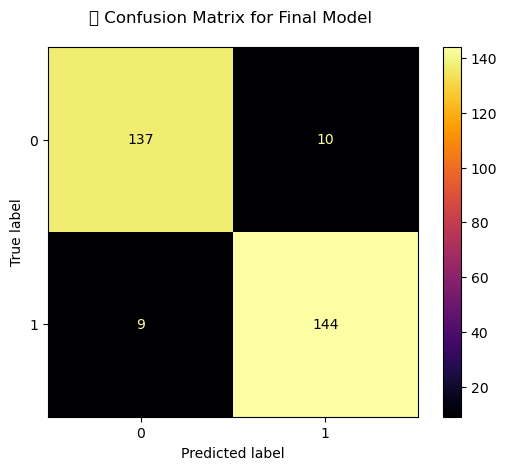

In [130]:
plt.style.use('default')
class_names = df.columns
metrics.plot_confusion_matrix(final_modelc, x_test, y_test, cmap='inferno')
plt.title('\t Confusion Matrix for Final Model \n')
plt.show()

With the help of above confusion matrix I am able to understand the number of times I got the correct outputs and the number of times my ML model missed to provide the correct prediction (depicting in the black boxes).

# AUC ROC curve

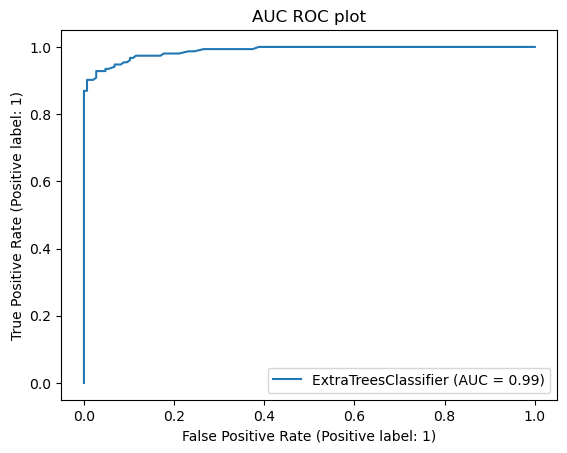

In [131]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(final_modelc, x_test, y_test)
plt.title("AUC ROC plot")
plt.show()

We got final accuracy score of 95% and Cross Validation Score of 91.3% and also AUC score is 0.99 which is really good.

# Saving the model in pickle Format

In [132]:
# pickeling or serialization of a file
import pickle
filename = 'Insurance_Claims_Fraud_Detection_Final_Model.pkl'
pickle.dump(final_modelc, open(filename, 'wb'))

# Prediction Conclusion:

In [133]:
import numpy as np
ac=np.array(y_test)
predictedc=np.array(final_modelc.predict(x_test))
df_comparisonc = pd.DataFrame({"original":ac,"predicted":predictedc},index= range(len(ac)))
df_comparisonc

,original,predicted
0,0,0
1,1,1
2,0,1
3,0,0
4,0,0
...,...,...
295,0,0
296,0,0
297,1,1
298,1,0


Hence predicted the "fraud_reported" using the final Model.

Saving the comparison file as a csv file.

In [134]:
df_comparisonc.to_csv('Insurance_Claims_Fraud_Detection_Prediction.csv')